# Chapter 11. Detection and Segmentation

- Segmentation
- Localization
- Detection

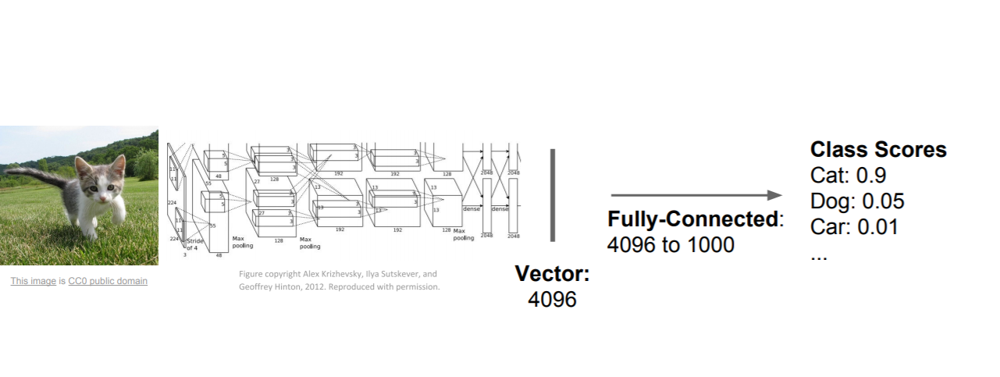

Input Image → Deep Conv Net → Feature Vector → Fully Connected Layer 

- Fully Connected Layer: 1000개의 class score 나타냄
  - 위 예제에서 1000개 class: ImageNet's class
- Input: Input Image → Output: category that contains every image

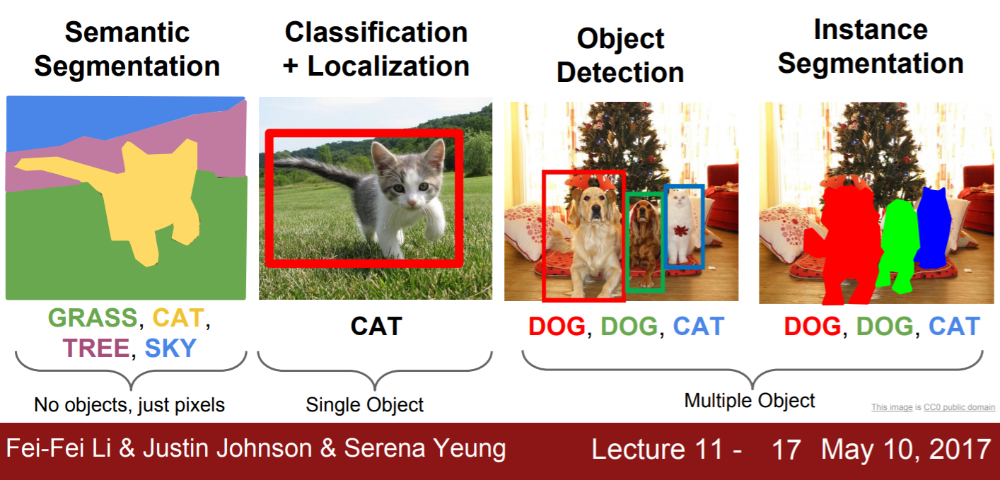

- **Sementic Segmentation**

- **Classification + Localization**

- **Object Detection**

- **Instance Segmentation**

## Sementic Segmentation

- input: image, output: category about all images

- 고양이 → 모든 픽셀에 대해 그 픽셀이 고양이/잔디/하늘.. 인지 결정

- *classification* 처럼 카테고리가 있음
  - **모든 픽셀**에 대해 카테고리가 매겨짐
  - **개별 객체** 구분 X

- 단점: 객체(암소 두 마리) 구분 X 
  - "암소" 레이블링된 픽셀 덩어리만 얻을 수 있음
  - Instance Segmentation이 극복함

### Approach


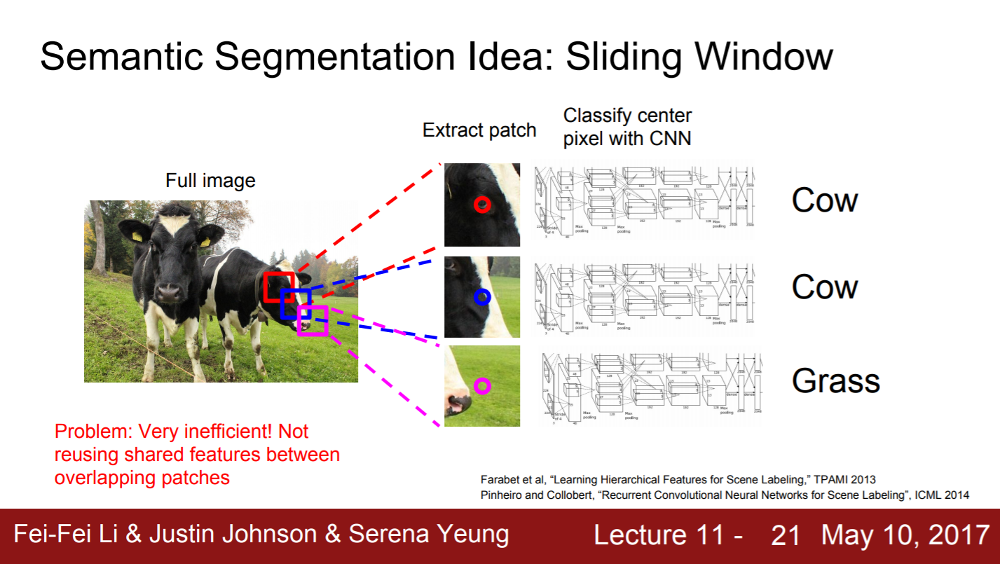

- Classification: Sliding Window
  - 이미지 작은 단위로 쪼갬 → 이 영역들만 가지고 classification 
  - 단점: *High Cost*
    - 작은 영역들 쪼갬 & 이 모든 영역을 forward/backward pass → 비효율적
  - 단점: 서로 다른 영역이라도 겹쳐 있을 수도 있음
    - 개별적으로 적용하는 방법 나쁨


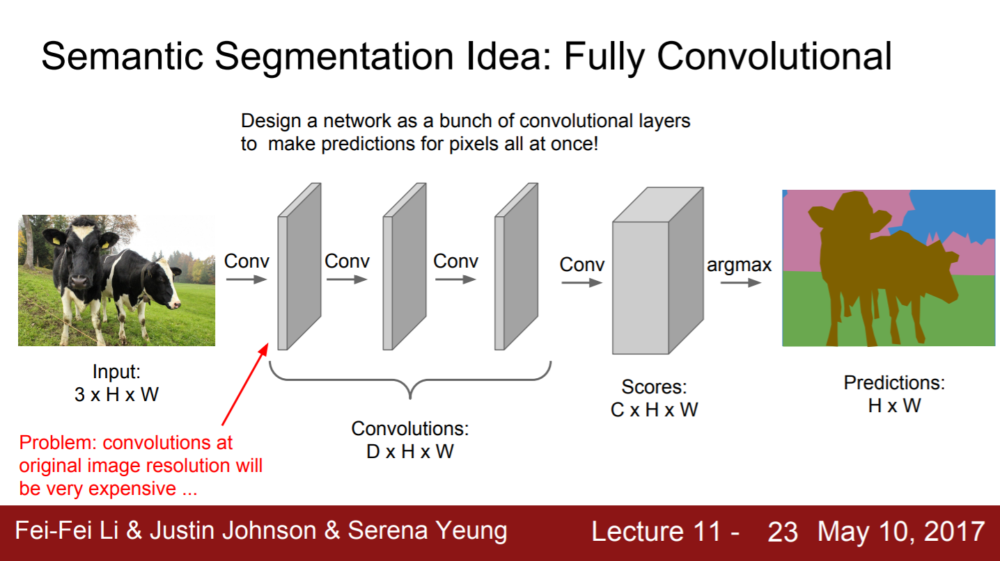

- Fully Convolutional Network
  - 이미지 영역 나눔 → 독집적 분류 X
  - output tensor: **모든 픽셀**에 대해 classification scores 매김
    - Conv Layer**만** 쌓은 network 이용 계산 가능
      - network 학습 위해: 모든 픽셀의 classification loss 계산 → 평균값 취함 → backpropagation

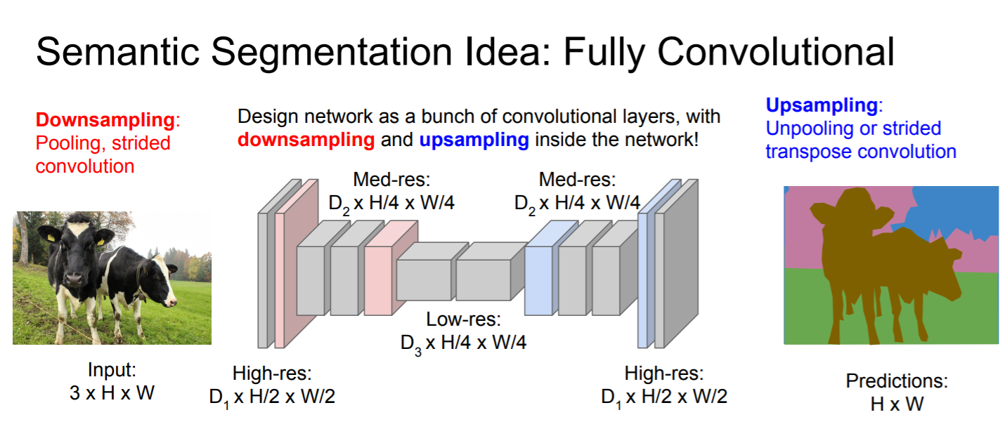

특정 map *downsampling/upsampling*

- 전체에 대한 conv 수행 <<< conv layer 소량 사용
  - max pooling, stride conv 등으로 **Downsample** 수행
    - convolutions in downsampling 반복

- Image Classification: *FC-Layer*
  - 여기서는 **Spatial Resoultion** 다시 키움 → 입력 이미지 해상도와 동일해짐
    - 계산 효율 증가
    - lower resoultion 처리 가능, deeper net 가능

- **upsampling**의 전략: unpooling

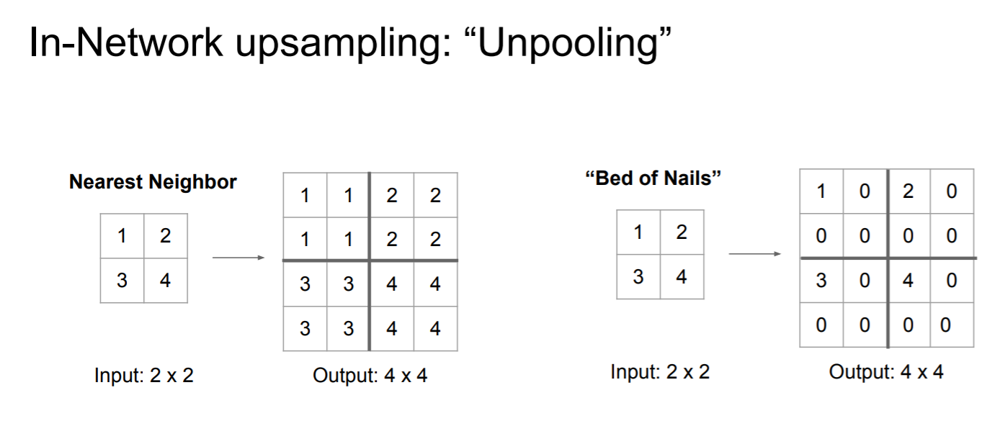

**Unpooling**

- pooling(downsample): average/max pooling
  - average pooling: compute spatial average at each receptive field

- unsampling
  - nearest neighbor unpooling
    - 2x2 stride nearest neighbor unpooling: just copy to each receptive field
  - bed of nails unpooling(unsampling)
    - just copy on unpooling region, and other sides are all 0


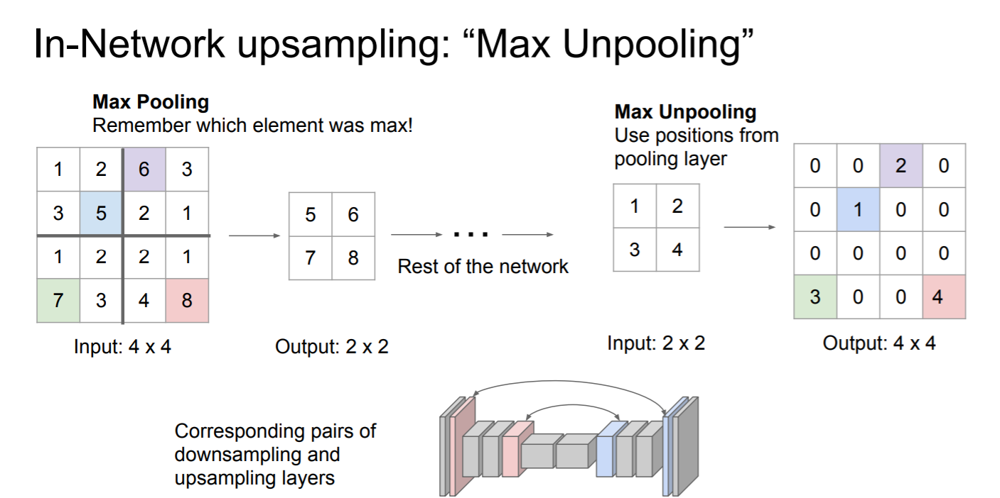

- Max Unpooling
  - connect each unpooling-pooling
  - at downsampling: max pooling에 사용했던 요소 기억하고 있어야 함
    - bed of nails unsampling과 유사, 하지만 같은 자리 X Maxpooling에서 선택된 위치에 맞게 넣어 줌
  - Low Resolution Feature Map → High Resoultion Feature Map
    - Low Resoultion의 값 → Maxpooling에서 선택된 위치
  - **missing spacial information**을 더 잘 유지하도록 도움


> 세 가지 방법의 **공통점**
>
> fixed 고정된 함수
>
> 별도 학습 X
>
> transpose convolution은 unsampling에서도 학습 가능

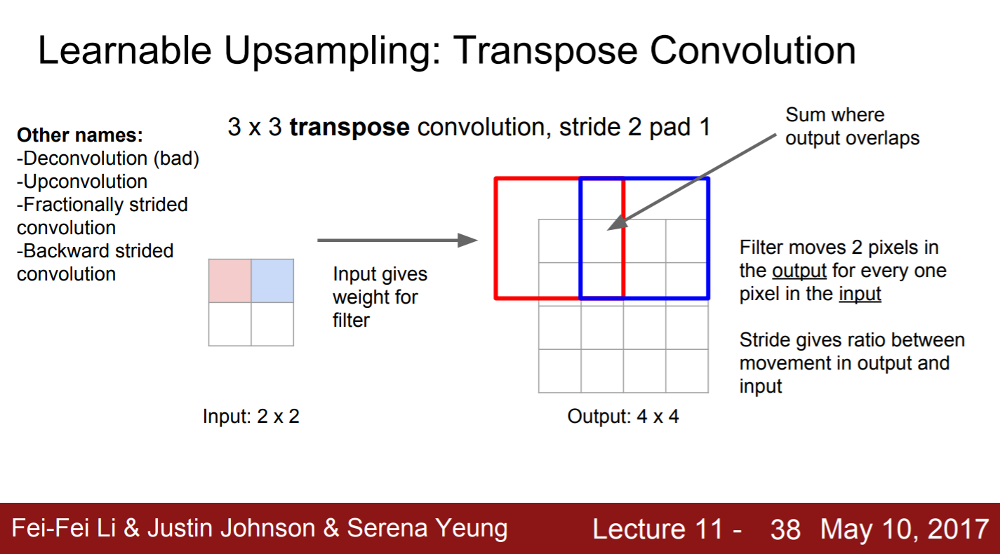

**Transpose Convoluton**

- 특정 map을 unsampling 할 때 어떤 방식으로 학습할지 **Train** 가능

- 특수한 방식의 Convolution의 일종

- Strided Convolution: 한 픽셀씩 이동 계산 X
  - output에서 한 pixel - input에서는 두 pixel
  - *stride*: 입력/출력에서 움직이는 거리 사이의 비율
  - **Transpose Convolution**과 **반대**

- input: filter에 곱해지는 weight 역할
  - **output: filter * weight**
  - input에서 한 칸 - output에서 두 칸
  - output에서 transpose convolution간의 receptive field가 중복 → 간단하게 두 값을 더해 줌
  
- deconvolution 용어 주의


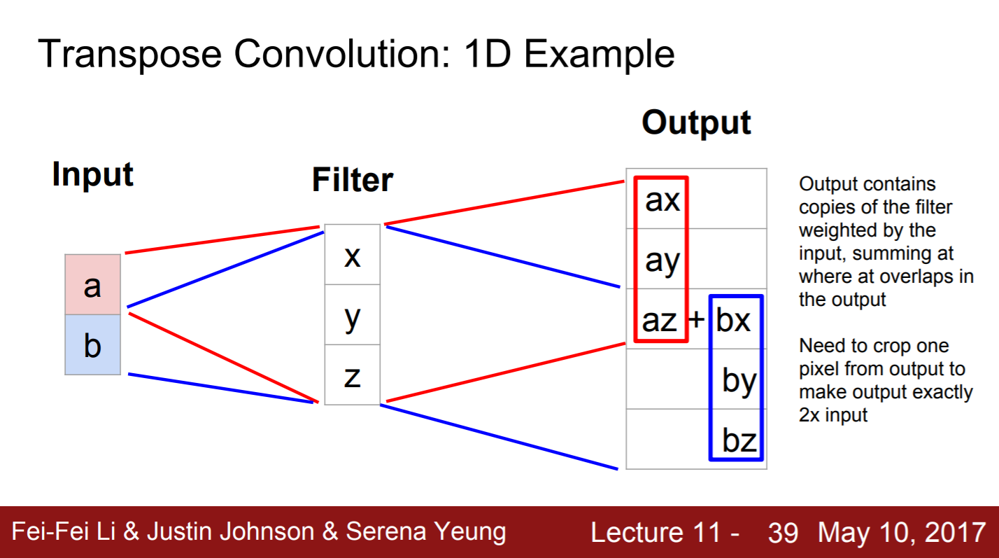

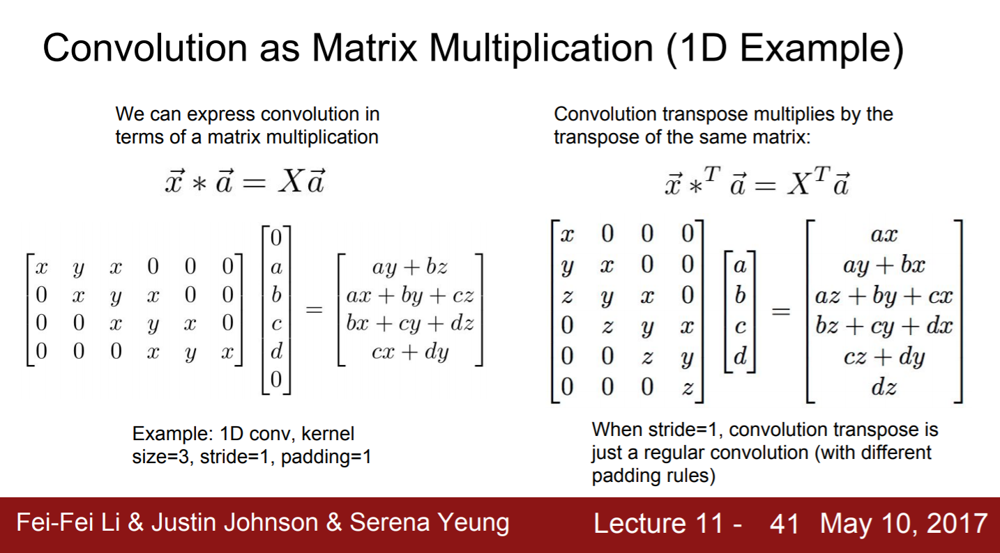

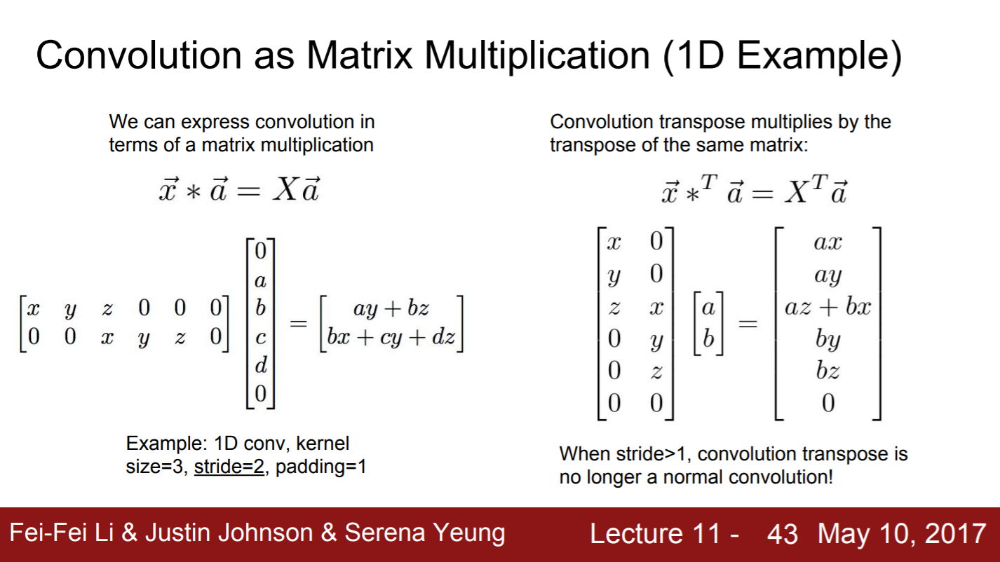

## Classification + Localization

- 이미지가 어떤 카테고리 + 어디 있는지 (네모 박스)

- object detection 문제와 구분
  - *Localization*: 이미지 내에 내가 관심 있는 객체 **오직 하나**
  - classification plus localization이라고 부름
    - image classification 사용 기법 그대로 사용 가능

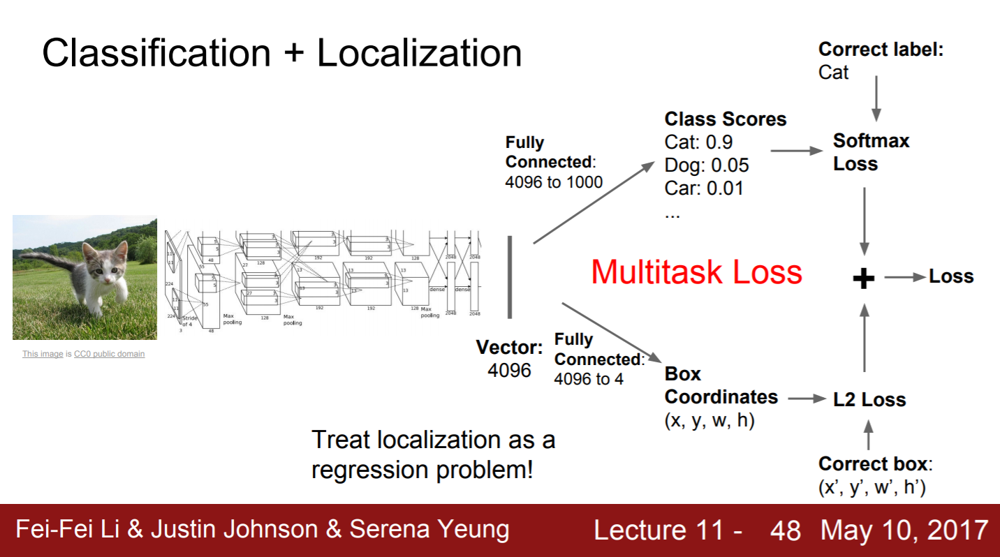

- Input

- **FC-layer + Class Score → Category**

- **FC-layer + 4 vector → width/height/x/y: location of bounding box**

- Output (2 output)
  - Class Score
  - Location of Bounding Box

- Two Loss Function
  - **softmax** for class scores
  - **L2 Loss** for BBox Loss
      - or L1, smooth L1..
      - BBox - GT Bbox 좌표 간 차이에 대한 regression loss
  - *Multi-task Loss* for combination of two loss
    - 2 loss -> 2 scalar -> have to minimize those both two loss
- fully supervised setting 가정
  - 학습 이미지: label + bounding box GT

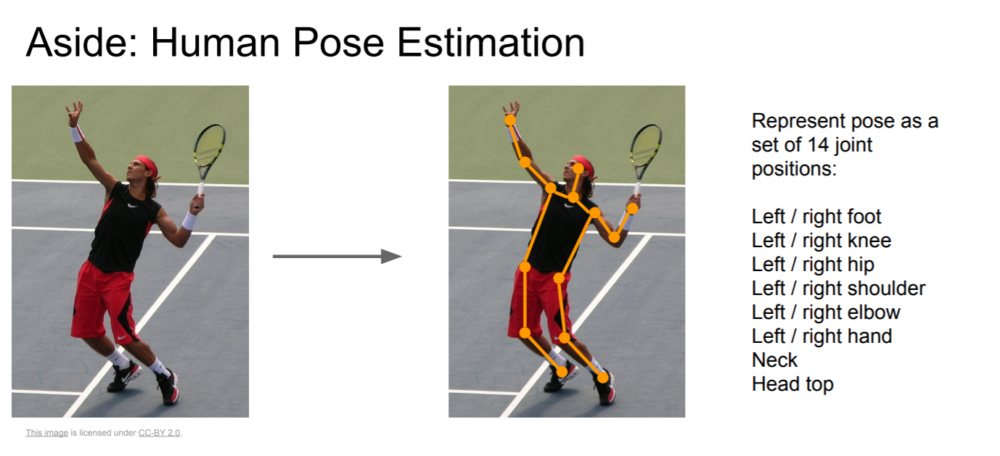

BBox와 같이 이미지 내의 위치 예측 아이디어: human pose estimation에서도 활용 가능

- input: human image
- output: each point of this person
- network: predict pose of this person
  - 사람의 팔다리가 어디? 예측

- example) 14개의 point
  - regression loss 계산 -> backprop 학습 

- **regression loss**
  - cross entropy, softmax 아닌 loss
  - 예를 들면 L2, L1, smooth L1 loss
  - **classification**: categorical
    - 클래스 스코어 예측
    - regression: continuous
      - 출력이 연속적인 값 즉 pose estimation-관절의 위치

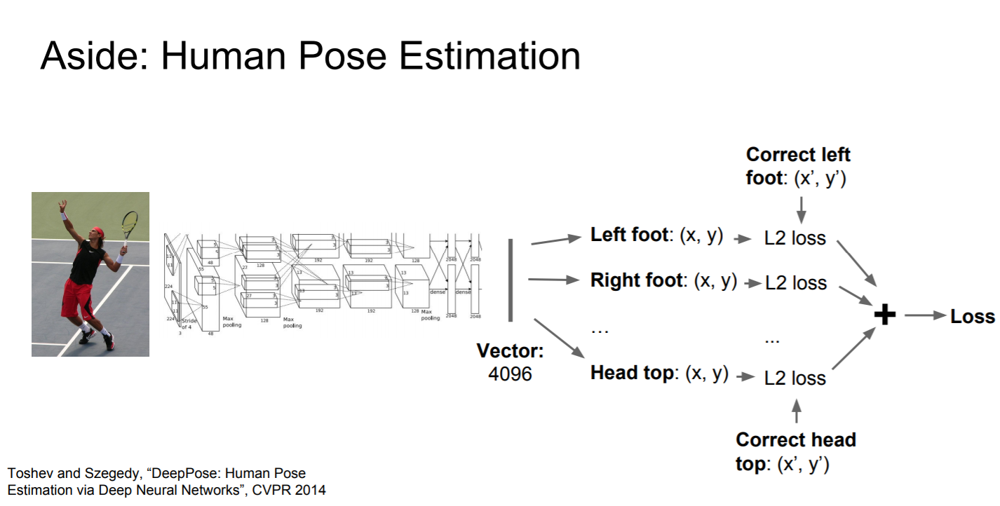

## Object Detection


- 고정된 카테고리 존재

- input image → output: Bbox, category
  - 예측 Bbox의 수 **입력 이미지에 따라 달라짐**
  - 각 이미지에 **객체가 몇 개 있는지 미지수**

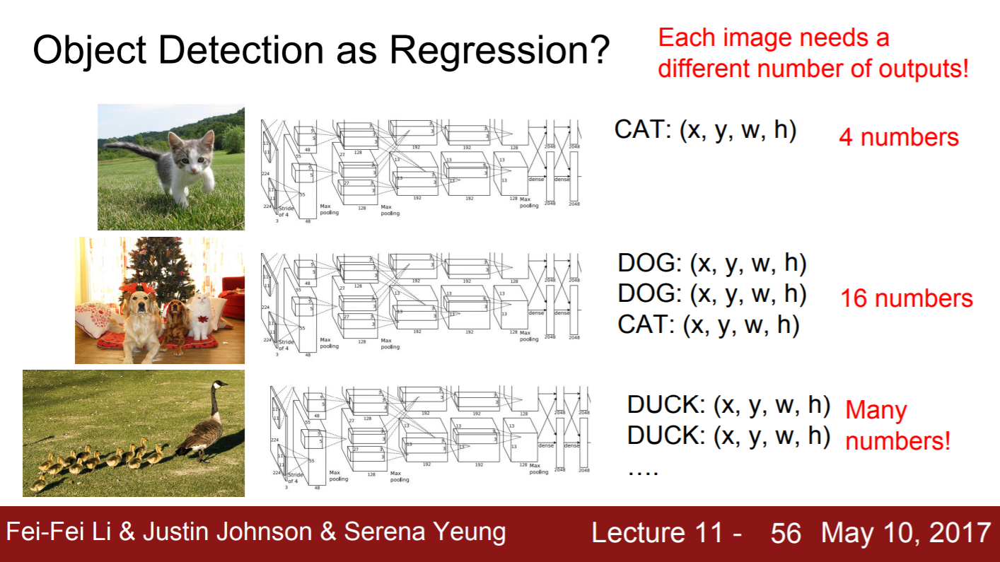

location 문제와 많이 다름: **detection** 문제에서는 이미지마다 객체의 **수** 달라짐, **미리 알 수 없음**

- New Paradigm!!

### Sliding Window

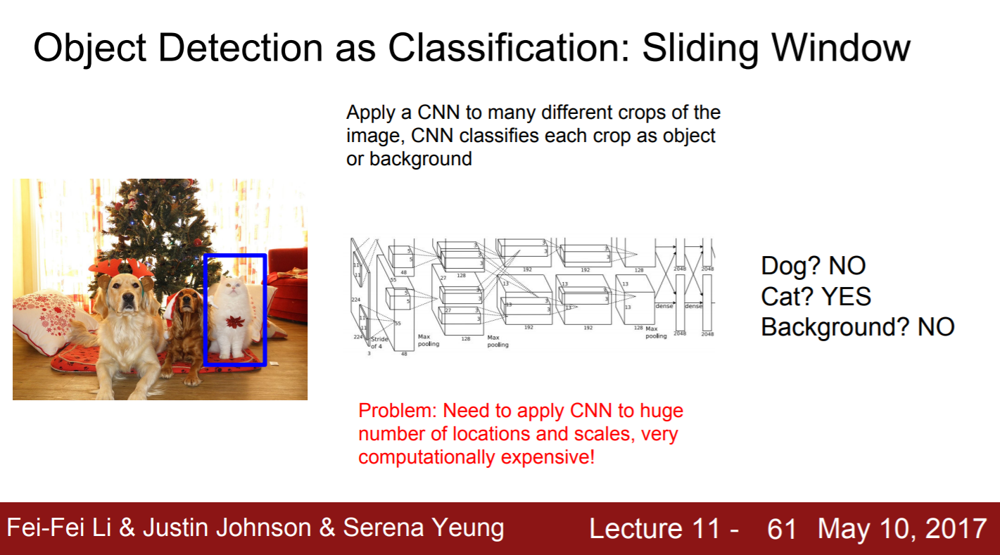

- 작은 영역으로 쪼개는 아이디어
  - 입력 이미지 → 다양한 영역 나눔

- **어떻게 영역을 추출?**
  - 몇 개, 어디 object? 알 수 없음
  - 크기도 알 수 없음
  - 종황비 당연히 모름

- **Brute Force** 방식의 sliding window → 경우의 수 너무 많음
  - 이걸 사용하는 일은 절대 never 없음

### Region Proposals

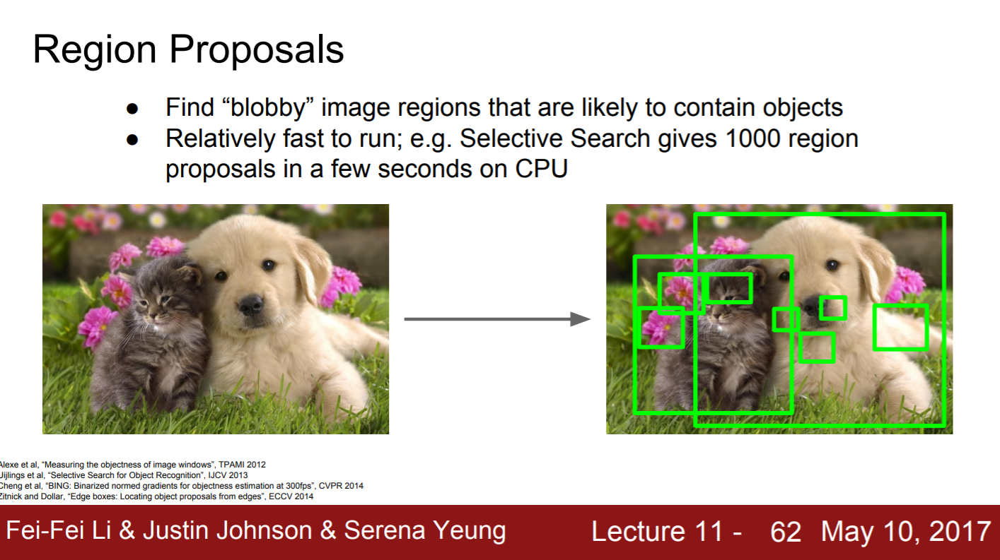

딥러닝을 사용하지는 않고.. 전통적인 방식

- 전통적 신호 처리 방식

- blobby 영역 찾아냄
  - 후보 영역들

- 만들어낼 수 있는 방법: select search
  - 2000개의 region proposal 만듦
  - 노이즈 상당..
  - 실제 객체 아니지만 recall 높음
    - 이미지에 객체 존재 → selective search의 region proposal 안에 속할 가능성 높음

이미지 내의 *모든* 위치, 스케일 전부 고려 X 

우선 Region Proposal Networks 적용 → Pegion Proposal 얻어냄 → 이걸 CNN의 입력으로 함 : 계산량 수월

broute force보다 훨씬 나음

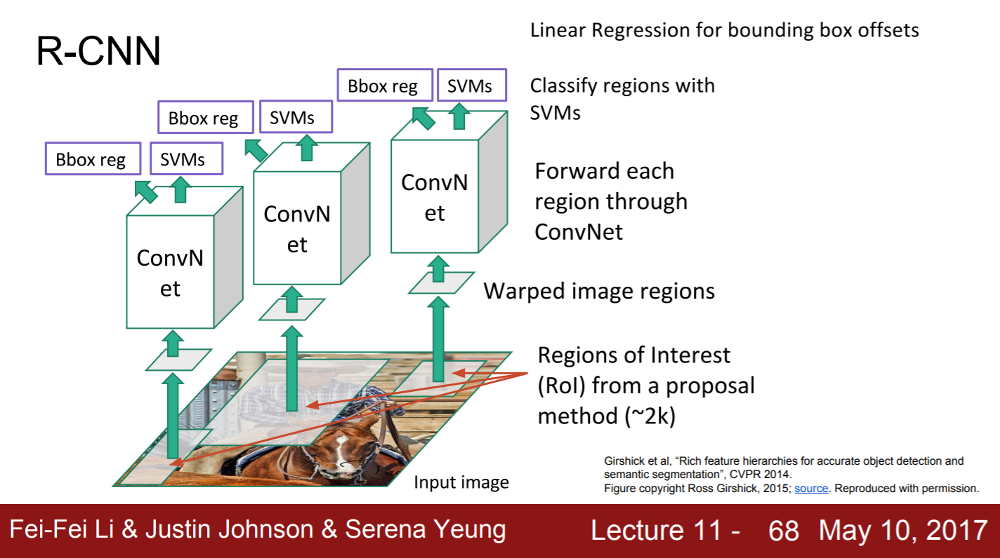

run Region Proposal Network(Selective Search) → get Region Proposal(Region of Interest, ROI) 

- 이때, ROI의 사이즈 다양한 게 단점 될 수 O
  - FC layer 등으로 인해 → 같은 input size로 맞춰 주어야 함
  - Region Proposals 추출 → **동일한 고정된 크기로** 변형시켜야 함

run Region Proposal Network(Selective Search) → get Region Proposal(Region of Interest, ROI) → *make same size* → regression.. → classification

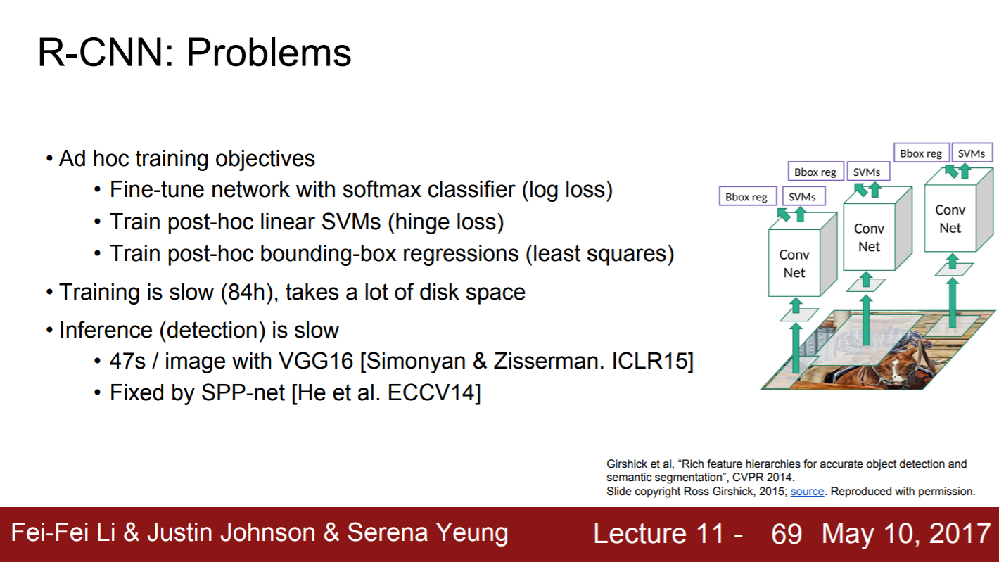

- 단점 존재
  - cost 높음
  - 학습 과정 오래 걸림
  - 느림
  - test도 느림

- Fast RCNN으로 극복

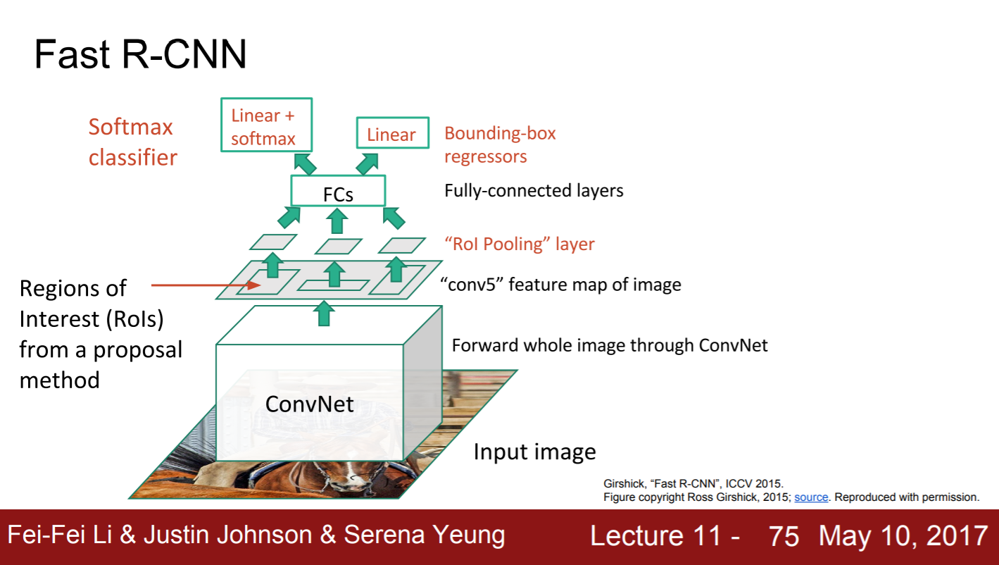

ROI**마다** CNN 수행하지 않음. **전체 이미지**에 대해 수행.

고해상도 feature map get 가능

image에서 ROI 추출 X

- CNN Feature Map <- Projcetion ROI => Feature Map으로부터 ROI 추출
  - CNN의 Feature을 여러 개의 ROIs가 서로 공유 가능

- RC-layer
  - ROI-pooling layer

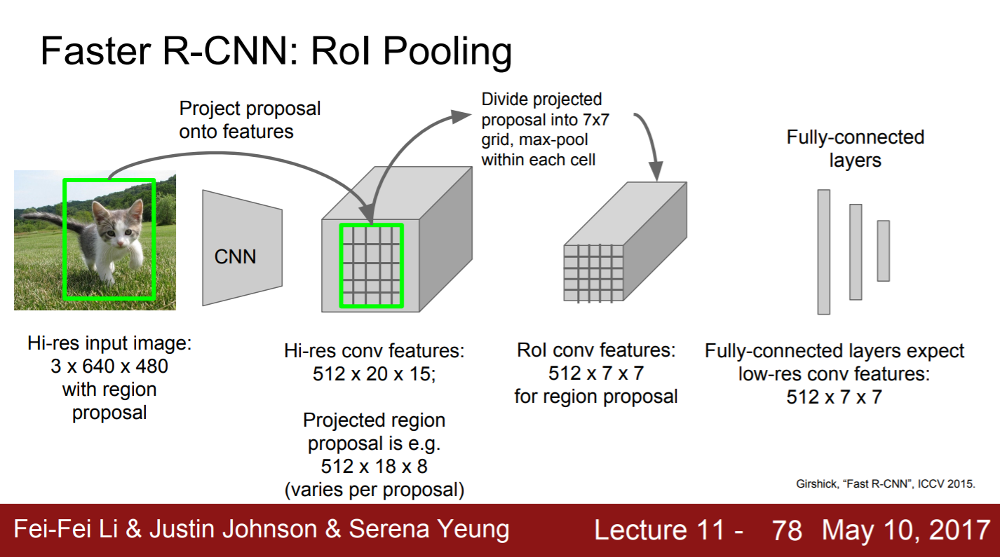

ROI from Feature Map size *warped* → FC-layer의 input으로 넣음 → Classification Score / Linear Regression Offset 계산 가능

- Train: Loss 두 개 합침 → Multi-task Loss로 backprop 진행
  - jointly, 합쳐서 전체 네트워크 동시 학습 가능

- 장점
  - 빠름
  - region proposal 직접 만들기 가능 (네트워크가)
    - 별도의 region proposal network 있음

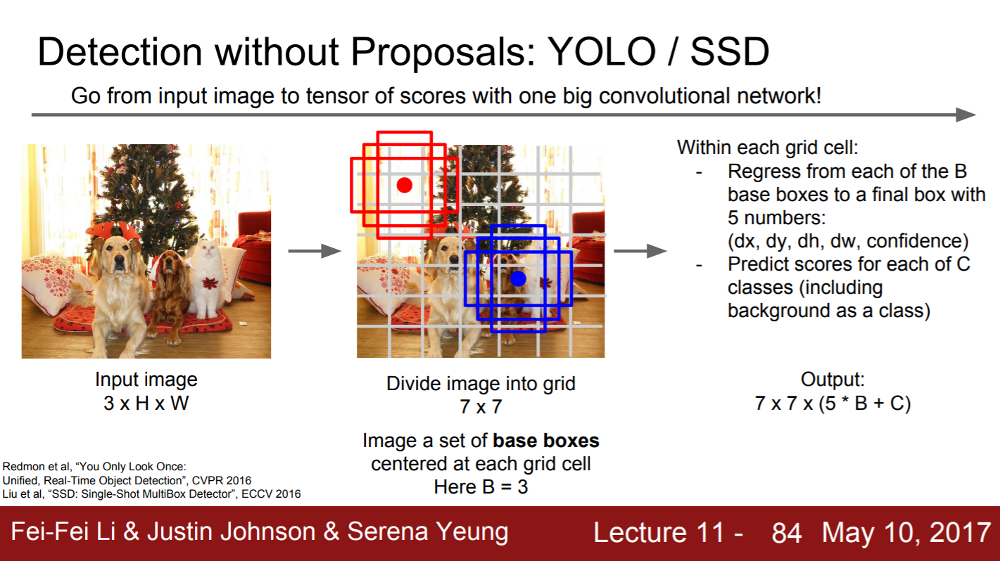

Feed Forward를 **오로지 한 방향**으로 수행하는 네트워크

1. YoLo
2. SSD (Single Shot Detection)

- main idea
  - Task 따로 계산 X
    - **하나**의 **regression** 문제로 풀어 보자는 것

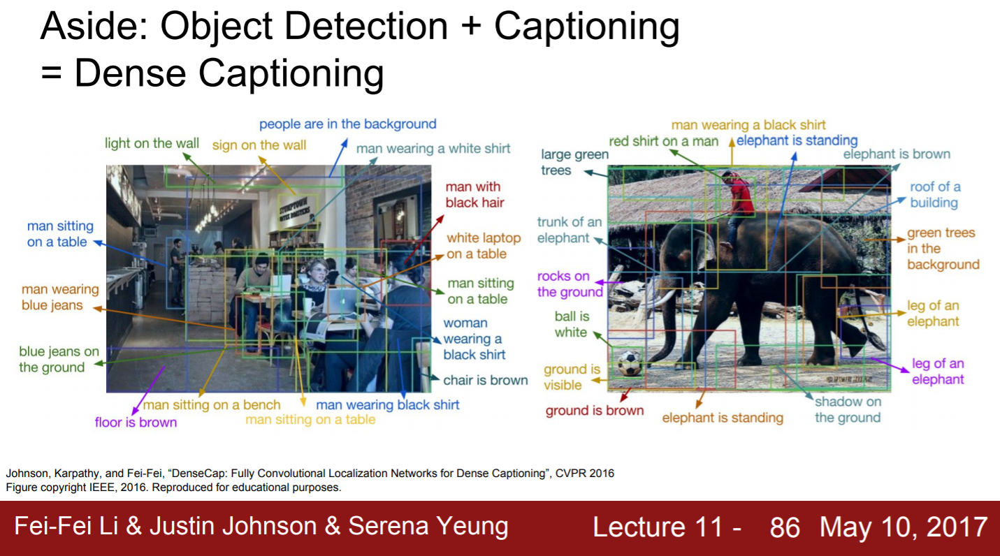

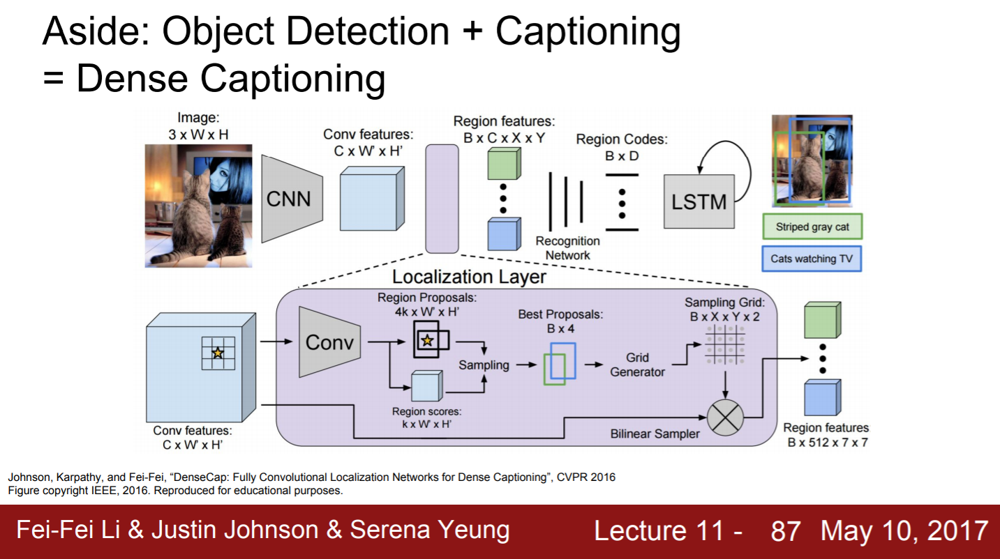

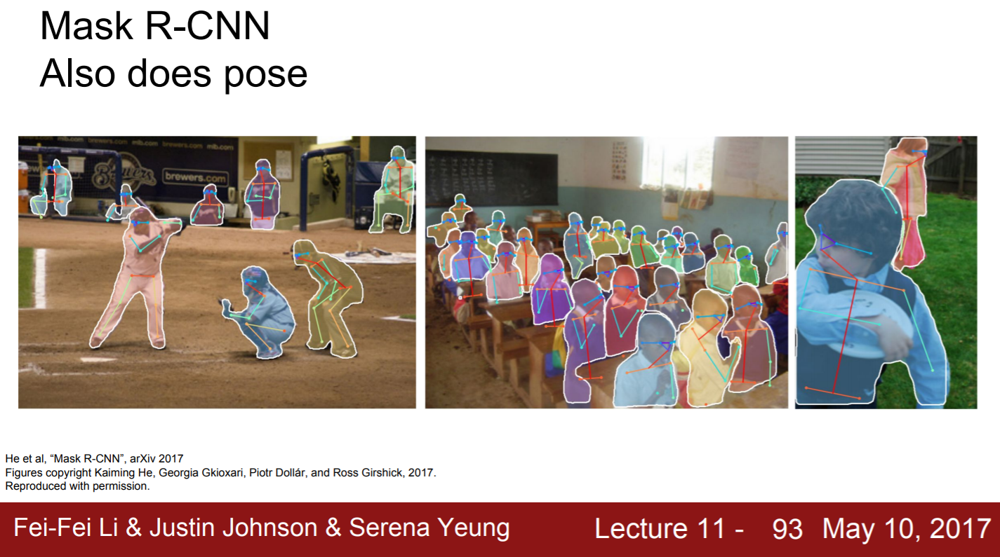